<a href="https://colab.research.google.com/github/APURVSAXENA/Missouri-Traffic-Accident-Data/blob/main/Descriptive_%26_Predictive_Analysis_on_different_factors_influencing_road_accidents_Part_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1 align="center"> Missouri Traffic Accident Data</h1>     Descriptive & Predictive Analysis on different factors influencing road accidents </h2>

## 1. Introduction
US-Accidents can be used for numerous applications such as real-time accident prediction, studying accident hotspot locations, casualty analysis and extracting cause and effect rules to predict accidents, and studying the impact of precipitation or other environmental stimuli on accident occurrence. This data has been collected in real-time, using multiple Traffic APIs. Currently, it contains data that is collected from February 2016 to December 2019 for the Contiguous United States.

This is a countrywide traffic accident dataset, which covers 49 states of the United States from which we are taking 3 states into consideration. The data is collected from February 2016 to December 2019, using several data providers, including two APIs that provide streaming traffic incident data. These APIs broadcast traffic data captured by a variety of entities, such as the US and state departments of transportation, law enforcement agencies, traffic cameras, and traffic sensors within the road-networks. Currently, there are about 3.0 million accident records in this dataset.

Most of the accidents take place due to bad weather conditions (like heavy fog, rain, sleet, wind), traffic, because of drivers mood variations and so on.

Our study will focus on Weather_Condition factor, Temperature factor, Visibility factor, Wind_Speed factor, Wind_Direction factor and all other weather related factors. Also Severity factor, factors related to the place where the accident has occurred. Using this data we will create a model which would predict the list of accident prone areas for the next day based on the weather conditions, which would help the department of transportation and police to take necessary precautions to avoid accidents from occuring or to take immediate action if required.

In this project, we want to conduct an exploratory study on the road accidents and factors inﬂuencing it. Speciﬁcally, we want to answer the following research questions:
1. What are the predicting variables actually aﬀecting the road accidents?
2. How does weather conditions impact road accidents?
3. What are factors of the accident and how it could be mapped with severity?


## 2. Data

### 2.1. Data extraction
The dataset is collected from the below link

https://www.kaggle.com/sobhanmoosavi/us-accidents

The dataset will be filtered to contain the data of three states. This is due to the size of the original dataset being too large to feasibly manipulate. The three states the new dataset will be based on will be Missouri (MO), California (CA), and Maryland (MD). This will pull data from the west coast, midwest, and the east coast of the United States.

We then preceded to determine what variables included NULL values and how many NULL values there are so that we could remove them to further clean the data. We also determined what columns were necessary to  answer our research questions and removed any columns we deemed unnecessary.

In [ ]:
# Import Modules
import pandas as pd
import numpy as np

# Read in the data
dat = pd.read_csv("MO_Accidents.csv")

# Shows us the data types of each variable included within the study.
dat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7666 entries, 0 to 7665
Data columns (total 49 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     7666 non-null   object 
 1   Source                 7666 non-null   object 
 2   TMC                    7666 non-null   int64  
 3   Severity               7666 non-null   int64  
 4   Start_Time             7666 non-null   object 
 5   End_Time               7666 non-null   object 
 6   Start_Lat              7666 non-null   float64
 7   Start_Lng              7666 non-null   float64
 8   End_Lat                0 non-null      float64
 9   End_Lng                0 non-null      float64
 10  Distance(mi)           7666 non-null   float64
 11  Description            7666 non-null   object 
 12  Number                 1088 non-null   float64
 13  Street                 7666 non-null   object 
 14  Side                   7666 non-null   object 
 15  City

In [ ]:
#Visualizes the data in a readable format
dat.head(1).transpose()

,0
ID,A-167306
Source,MapQuest
TMC,201
Severity,3
Start_Time,11/30/2016 17:32
End_Time,11/30/2016 18:02
Start_Lat,38.65
Start_Lng,-90.4486
End_Lat,NaN
End_Lng,NaN


### 2.2. Key Information in The Dataset


SlNo. Attribute: Description
1. ID: This is a unique identifier of the accident record.
2. Source: Indicates source of the accident report (i.e. the API which reported the accident.).
3. TMC: A traffic accident may have a Traffic Message Channel (TMC) code which provides a more detailed description of the event.
4. Severity: Shows the severity of the accident, a number between 1 and 4, where 1 indicates the least impact on traffic (i.e., short delay as a result of the accident) and 4 indicates a significant impact on traffic (i.e., long delay).
5. Start_Time: Shows start time of the accident in the local time zone.
6. End_Time: Shows end time of the accident in the local time zone.
7. Start_Lat: Shows latitude in GPS coordinate of the start point.
8. Start_Lng: Shows longitude in GPS coordinate of the start point.
9. End_Lat: Shows latitude in GPS coordinate of the end point.
10. End_Lng: Shows longitude in GPS coordinate of the end point.
11. Distance(mi): The length of the road extent affected by the accident.
12. Description: Shows natural language description of the accident.
13. Number: Shows the street number in the address field.
14. Street: Shows the street name in the address field.
15. Side: Shows the relative side of the street (Right/Left) in the address field.
16. City: Shows the city in the address field.
17. County: Shows the county in the address field.
18. State: Shows the state in the address field.
19. Zip Code: Shows the zip code in the address field.
20. Country: Shows the country in the address field.
21. Timezone: Shows timezone based on the location of the accident (eastern, central, etc.).
22. Airport_Code: Denotes an airport-based weather station which is the closest one to the location of the accident.
23. Weather_Timestamp: Shows the time-stamp of weather observation record (in local time).
24. Temperature(F): Shows the temperature (in Fahrenheit).
25. Wind_Chill(F): Shows the wind chill (in Fahrenheit).
26. Humidity(%): Shows the humidity (in percentage).
27. Pressure(in): Shows the air pressure (in inches).
28. Visibility(mi): Shows visibility (in miles).
29. Wind_Direction: Shows wind direction.
30. Wind_Speed(mph): Shows wind speed (in miles per hour).
31. Precipitation(in): Shows precipitation amount in inches, if there is any.
32. Weather_Condition: Shows the weather condition (rain, snow, thunderstorm, fog, etc.)
33. Amenity: A POI annotation which indicates the presence of amenity in a nearby location.
34. Bump: A POI annotation which indicates presence of speed bump or hump in a nearby location.
35. Crossing: A POI annotation which indicates the presence of crossing in a nearby location.
36. Give_Way: A POI annotation which indicates the presence of a give_way in a nearby location.
37. Junction: A POI annotation which indicates the presence of a junction in a nearby location.
38. No_Exit: A POI annotation which indicates the presence of no_exit in a nearby location.
39. Railway: A POI annotation which indicates the presence of railway in a nearby location.
40. Roundabout: A POI annotation which indicates the presence of roundabout in a nearby location.
41. Station: A POI annotation which indicates the presence of a station in a nearby location.
42. Stop: A POI annotation which indicates the presence of a stop in a nearby location.
43. Traffic_Calming: A POI annotation which indicates the presence of traffic_calming in a nearby location.
44. Traffic_Signal: A POI annotation which indicates the presence of traffic_signal in a nearby location.
45. Turning_Loop: A POI annotation which indicates the presence of a turning_loop in a nearby location.
46. Sunrise_Sunset: Shows the period of day (i.e. day or night) based on sunrise/sunset.
47. Civil_Twilight: Shows the period of day (i.e. day or night) based on civil twilight.
48. Nautical_Twilight: Shows the period of day (i.e. day or night) based on nautical twilight.
49. Astronomical_Twilight: Shows the period of day (i.e. day or night) based on astronomical twilight.



### 2.3. Clean the Data


In [ ]:
# Apply() allows us to see what variables include NULL values and how many NULL values are there.
dat.apply(lambda x: sum(x.isnull()), axis=0)

ID                          0
Source                      0
TMC                         0
Severity                    0
Start_Time                  0
End_Time                    0
Start_Lat                   0
Start_Lng                   0
End_Lat                  7666
End_Lng                  7666
Distance(mi)                0
Description                 0
Number                   6578
Street                      0
Side                        0
City                        0
County                      0
State                       0
Zipcode                     0
Country                     0
Timezone                    0
Airport_Code                1
Weather_Timestamp          54
Temperature(F)             66
Wind_Chill(F)            1744
Humidity(%)                69
Pressure(in)               66
Visibility(mi)             71
Wind_Direction             89
Wind_Speed(mph)           277
Precipitation(in)        1850
Weather_Condition          72
Amenity                     0
Bump      

In [ ]:
#Summary of the statistics
dat.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
TMC,7666.0,209.557396,25.158507,201.000000,201.000000,201.000000,201.000000,406.000000
Severity,7666.0,2.711584,0.483425,1.000000,2.000000,3.000000,3.000000,4.000000
Start_Lat,7666.0,38.646983,0.429148,36.089977,38.562069,38.672737,38.803123,40.466331
Start_Lng,7666.0,-91.483290,1.744734,-95.480331,-93.277824,-90.449280,-90.339684,-89.533127
End_Lat,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
End_Lng,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Distance(mi),7666.0,0.114018,0.648372,0.000000,0.000000,0.000000,0.000000,13.820000
Number,1088.0,4497.553309,4097.305301,1.000000,1236.000000,3300.000000,6402.750000,24499.000000
Temperature(F),7600.0,61.061039,19.066254,-0.900000,48.000000,64.000000,76.000000,102.900000
Wind_Chill(F),5922.0,57.085681,22.538226,-13.800000,39.000000,62.000000,75.000000,96.000000


We see that 'End_Lat' and 'End_Lng' columns are empty. Thus removing these columns is better as they are of no use.

In [ ]:
dat = dat.drop(['End_Lat', 'End_Lng'], axis=1)

As we are doing analysis on only Missouri state data some columns like Timezone, Country and State will have same values. Thus removing these columns is better as they are of no use. 

In [ ]:
dat = dat.drop(['Timezone', 'Country','State', 'Number', 'Astronomical_Twilight', 'Nautical_Twilight', 'Civil_Twilight', 'Roundabout', 'Bump', 'Weather_Timestamp', 'Airport_Code'], axis=1)
dat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7666 entries, 0 to 7665
Data columns (total 36 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 7666 non-null   object 
 1   Source             7666 non-null   object 
 2   TMC                7666 non-null   int64  
 3   Severity           7666 non-null   int64  
 4   Start_Time         7666 non-null   object 
 5   End_Time           7666 non-null   object 
 6   Start_Lat          7666 non-null   float64
 7   Start_Lng          7666 non-null   float64
 8   Distance(mi)       7666 non-null   float64
 9   Description        7666 non-null   object 
 10  Street             7666 non-null   object 
 11  Side               7666 non-null   object 
 12  City               7666 non-null   object 
 13  County             7666 non-null   object 
 14  Zipcode            7666 non-null   object 
 15  Temperature(F)     7600 non-null   float64
 16  Wind_Chill(F)      5922 

In [ ]:
# removing null values
dat =dat.dropna(axis=0)
dat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5424 entries, 20 to 7664
Data columns (total 36 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 5424 non-null   object 
 1   Source             5424 non-null   object 
 2   TMC                5424 non-null   int64  
 3   Severity           5424 non-null   int64  
 4   Start_Time         5424 non-null   object 
 5   End_Time           5424 non-null   object 
 6   Start_Lat          5424 non-null   float64
 7   Start_Lng          5424 non-null   float64
 8   Distance(mi)       5424 non-null   float64
 9   Description        5424 non-null   object 
 10  Street             5424 non-null   object 
 11  Side               5424 non-null   object 
 12  City               5424 non-null   object 
 13  County             5424 non-null   object 
 14  Zipcode            5424 non-null   object 
 15  Temperature(F)     5424 non-null   float64
 16  Wind_Chill(F)      5424

## 3. Data Exploration

### 3.1. Data Transformation

We notice that the Start_Time and End_Time columns are represented as strings. It's better to represent them as datetime objects. Let's transform them by calling the to_datetime() function in the pandas module.

In [ ]:
dat['Start_Time'] = pd.to_datetime(dat['Start_Time'])
dat['End_Time'] = pd.to_datetime(dat['End_Time'])

In [ ]:
# Describe the Start_Time column
dat['Start_Time'].describe()

count                    5424
unique                   5293
top       2019-12-16 05:30:00
freq                        3
first     2016-09-14 08:33:00
last      2019-12-31 21:41:00
Name: Start_Time, dtype: object

In [ ]:
# Describe the End_Time column
dat['End_Time'].describe()

count                    5424
unique                   5177
top       2019-04-30 19:22:00
freq                        6
first     2016-09-14 09:03:00
last      2019-12-31 22:56:00
Name: End_Time, dtype: object

In many cases, we may need to know the year, month, day of week, hour information of the accident. These columns may be helpful in visualizing the data as well as regression or predicitive analyses. Let's create seperate variables.

In [ ]:
# Create Start_Year column
dat['Start_Year'] = dat['Start_Time'].dt.year
# Create Start_Month column
dat['Start_Month'] = dat['Start_Time'].dt.month
# Create Start_Dayofweek column (0=Mon, 6=Sun)
dat['Start_Dayofweek'] = dat['Start_Time'].dt.dayofweek
# Create Start_Hour column
dat['Start_Hour']= dat['Start_Time'].dt.hour

We noticed that there are few columns with boolean values which can be replaced with 1 and 0

In [ ]:
# Replace Boolean values with numbers
dat.replace([True, False], [1, 0], inplace=True)

In [ ]:
dat['Amenity'].unique()

array([0, 1], dtype=int64)

As extreme weather conditions like for, rain, snow effect number of accidents because they create trouble to the driver in visibility of road and slippery roads we should create dummies for Weather_Condition and take only required extreme condions. These columns may be helpful in knowing the relationship between severity and extreme weather conditions.

Let's create dummies and append them to our dataset.

In [ ]:
# creating dummies for Weather_Conditions
dummy = pd.get_dummies(dat['Weather_Condition'])

In [ ]:
#dat.reset_index(drop=True, inplace=True)
#dummy.reset_index(drop=True, inplace=True)

In [ ]:
## adding only extreme weather conditions to the dataset
dat = pd.concat([dat, dummy[['Fog', 'Rain', 'Heavy Rain', 'Light Rain', 'Snow']]], axis=1)

In [ ]:
# Renaming Heavy Rain and Light Rain to avoid space between them
dat = dat.rename(columns={"Heavy Rain": "Heavy_Rain", "Light Rain": "Light_Rain"})

In [ ]:
dat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5424 entries, 20 to 7664
Data columns (total 45 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   ID                 5424 non-null   object        
 1   Source             5424 non-null   object        
 2   TMC                5424 non-null   int64         
 3   Severity           5424 non-null   int64         
 4   Start_Time         5424 non-null   datetime64[ns]
 5   End_Time           5424 non-null   datetime64[ns]
 6   Start_Lat          5424 non-null   float64       
 7   Start_Lng          5424 non-null   float64       
 8   Distance(mi)       5424 non-null   float64       
 9   Description        5424 non-null   object        
 10  Street             5424 non-null   object        
 11  Side               5424 non-null   object        
 12  City               5424 non-null   object        
 13  County             5424 non-null   object        
 14  Zipcode

In [ ]:
dat.to_csv('Cleaned_MO_Accidents.csv', index=False)

### 3.2. Accidents across Missouri Area and Time

In [ ]:
# Matplotlib to visualize the data
import matplotlib.pyplot as plt

#Show plot in jupyter notebook
%matplotlib inline

import seaborn as sns

#### 3.2.1 Accidents across Missouri State Area wise

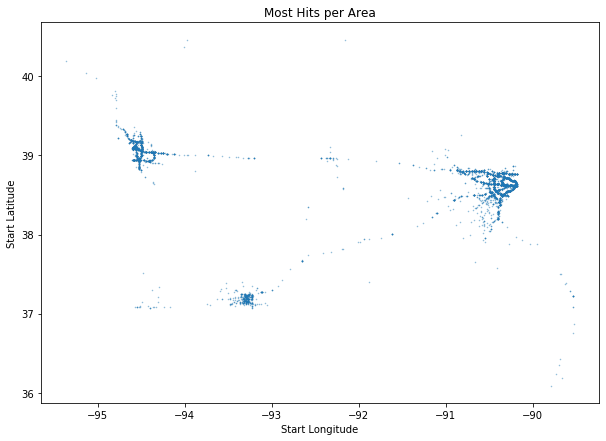

In [ ]:
#plotting the Lat against Long could show the map of the Missouri area
plt.figure(figsize=(10,7))
plt.title('Most Hits per Area')
plt.xlabel('Start Longitude')
plt.ylabel('Start Latitude')
plt.plot(dat.Start_Lng, dat.Start_Lat, ".", alpha=0.5, ms=1)
plt.show()

#### 3.2.2. Accidents across different Counties

In [ ]:
# Accidents per County
County = dat.County.value_counts()
print(County)

St. Louis County    1965
Jackson             1141
St. Louis City       565
St. Charles          449
Jefferson            351
Greene               344
Clay                 219
Platte                99
Franklin              54
Cass                  30
Boone                 29
Jasper                21
Saline                13
Phelps                12
Warren                11
Lafayette             11
Laclede               10
Scott                  9
Lincoln                7
Buchanan               7
St. Francois           6
Webster                6
Cape Girardeau         6
Montgomery             6
Ste Genevieve          5
Pulaski                4
Christian              4
Washington             4
Pemiscot               4
Lawrence               3
Holt                   3
Miller                 3
New Madrid             3
Callaway               3
Saint Louis            3
Harrison               2
Crawford               2
Cole                   2
Gasconade              1
Pike                   1


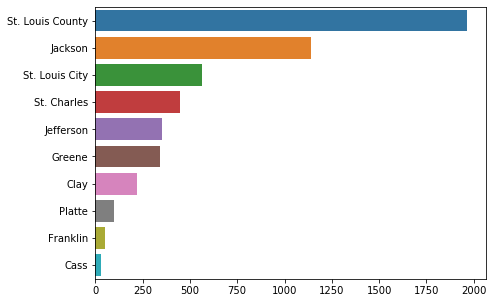

In [ ]:
#As there are many Counties with less numeber of accidents considering only top 10 
County = County.head(10)
plt.figure(figsize=(7, 5))
sns.barplot(County.values, County.index)

#### 3.2.3. Number of Accidents per each Weather Condition

In [ ]:
# Value count of number of accidents per each weather condition
Weather = dat.Weather_Condition.value_counts()
len(Weather)

41

In [ ]:
# Viewing the Weather data
Weather

Fair                            2343
Cloudy                           979
Mostly Cloudy                    669
Light Rain                       401
Partly Cloudy                    341
Light Snow                       131
Rain                              72
Light Rain with Thunder           66
Fog                               60
T-Storm                           38
Haze                              36
Cloudy / Windy                    30
Heavy Rain                        28
Fair / Windy                      28
Snow                              26
Heavy T-Storm                     23
Partly Cloudy / Windy             17
Overcast                          17
Light Drizzle                     17
Thunder                           16
Thunder in the Vicinity           14
Wintry Mix                        13
Mostly Cloudy / Windy             11
Light Snow / Windy                 8
Light Snow and Sleet               5
Light Freezing Rain                4
Heavy Snow                         4
T

In [ ]:
#As there are many weather condition with less numeber of accidents considering only top 10 
Weather = Weather.head(10)
len(Weather)

10

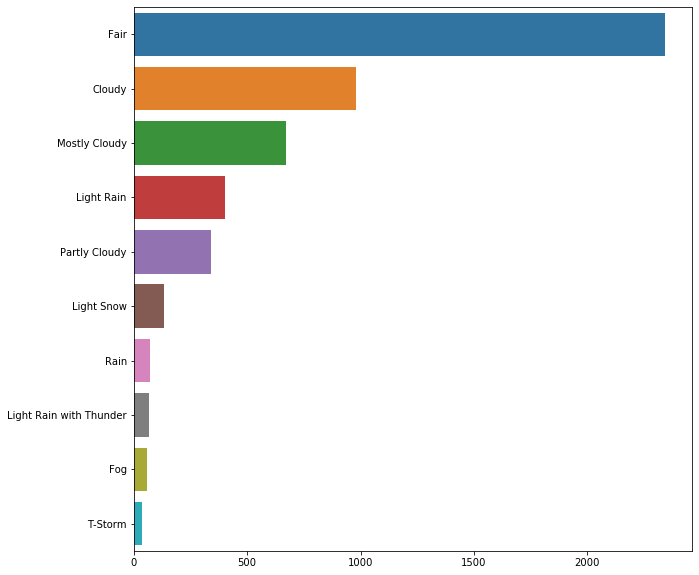

In [ ]:
# Seaborn to visualize the data
import seaborn as sns
plt.figure(figsize=(10, 10))
sns.barplot(Weather.values, Weather.index)

#### 3.2.4. Number of Accidents per Temperature (F)

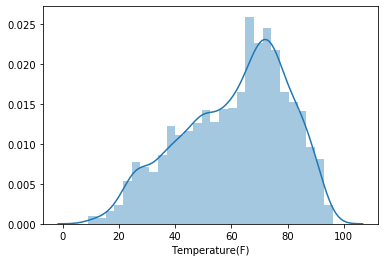

In [ ]:
Temperature = dat['Temperature(F)'].value_counts()
#print(Temperature)
# Temperature Distribution Plot
sns.distplot(dat['Temperature(F)'])

#### 3.2.5. Number of Accidents per Visibility (mi)

In [ ]:
visibilityResult = dat.groupby('Visibility(mi)').count()
visibilityResult

,ID,Source,TMC,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,...,Sunrise_Sunset,Start_Year,Start_Month,Start_Dayofweek,Start_Hour,Fog,Rain,Heavy_Rain,Light_Rain,Snow
Visibility(mi),,,,,,,,,,,,,,,,,,,,,
0.00,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
0.20,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
0.25,11,11,11,11,11,11,11,11,11,11,...,11,11,11,11,11,11,11,11,11,11
0.50,33,33,33,33,33,33,33,33,33,33,...,33,33,33,33,33,33,33,33,33,33
0.75,24,24,24,24,24,24,24,24,24,24,...,24,24,24,24,24,24,24,24,24,24
0.80,6,6,6,6,6,6,6,6,6,6,...,6,6,6,6,6,6,6,6,6,6
1.00,89,89,89,89,89,89,89,89,89,89,...,89,89,89,89,89,89,89,89,89,89
1.20,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
1.50,4,4,4,4,4,4,4,4,4,4,...,4,4,4,4,4,4,4,4,4,4


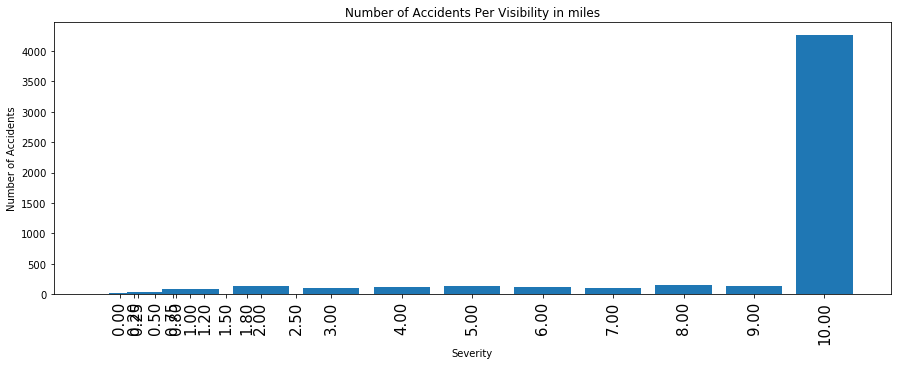

In [ ]:
plt.figure(figsize=(15, 5))
plt.title('Number of Accidents Per Visibility in miles')
plt.bar(visibilityResult.index, visibilityResult.ID)
plt.xlabel('Severity')
plt.ylabel('Number of Accidents')
plt.xticks(visibilityResult.index, rotation='vertical', size=15)
plt.show()

#### 3.2.6. Number of Accidents per Year, Month, Dayof Week

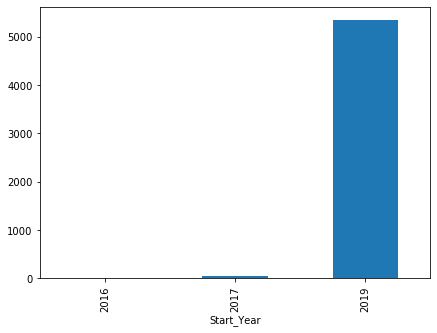

In [ ]:
# Accidents per year
plt.figure(figsize =(7,5))
dat.groupby(['Start_Year']).size().plot.bar()

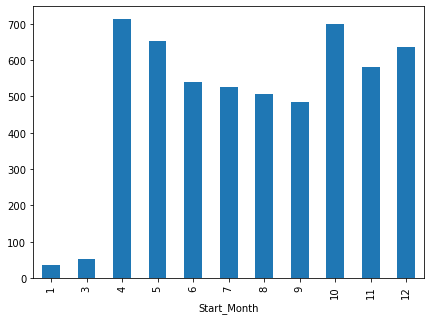

In [ ]:
#Accidents per month
plt.figure(figsize =(7,5))
dat.groupby(['Start_Month']).size().plot.bar()

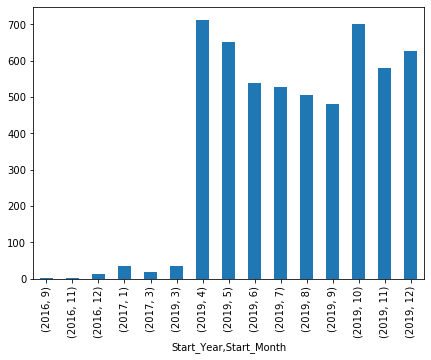

In [ ]:
#Accidents per each month year wise
plt.figure(figsize =(7,5))
dat.groupby(['Start_Year','Start_Month']).size().plot.bar()

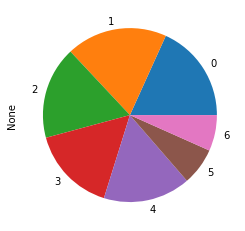

In [ ]:
#Accidents day wise
dat.groupby(['Start_Dayofweek']).size().plot.pie()

#### 3.2.7. Number of Accidents per Day Zone

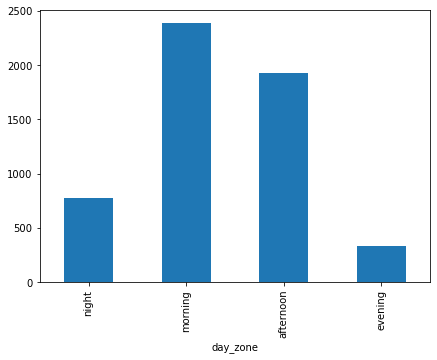

In [ ]:
dat['day_zone'] = pd.cut((dat['Start_Hour']),bins=(0,6,12,18,24), labels=["night", "morning", "afternoon", "evening"])
plt.figure(figsize =(7,5))
dat.groupby(['day_zone']).size().plot.bar()

#### 3.2.8. Number of Accidents per Side of the street

Text(0, 0.5, 'Number of Accidents')

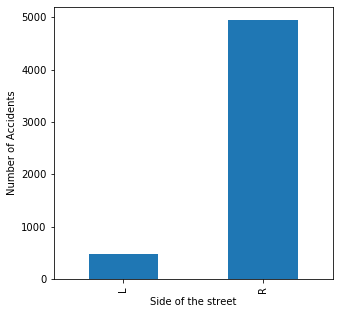

In [ ]:
plt.figure(figsize =(5,5))
dat.groupby(['Side']).size().plot.bar()
plt.xlabel('Side of the street')
plt.ylabel('Number of Accidents')

We can see that more number of accidents happen on right side campared to left side of the road 

### 3.3 Correlation Analysis

In [ ]:
# Show correlation matrix
dat.corr(method='pearson')

,TMC,Severity,Start_Lat,Start_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),...,Turning_Loop,Start_Year,Start_Month,Start_Dayofweek,Start_Hour,Fog,Rain,Heavy_Rain,Light_Rain,Snow
TMC,1.000000,0.148428,0.088813,-0.068543,0.106910,-0.106979,-0.114784,0.007943,0.021223,0.014274,...,NaN,0.014883,0.136668,0.003193,-0.064817,-0.020586,0.006565,-0.024942,-0.021333,0.015852
Severity,0.148428,1.000000,0.292266,0.038825,0.162850,0.039679,0.027385,-0.143652,0.113232,-0.017907,...,NaN,-0.020641,0.026827,0.101839,0.239256,-0.048140,-0.009186,0.011957,0.015458,0.035082
Start_Lat,0.088813,0.292266,1.000000,-0.217712,0.013590,-0.043364,-0.048703,-0.113108,0.200477,-0.002154,...,NaN,-0.010869,0.131034,0.087021,0.119337,0.004468,-0.043503,0.007481,-0.038707,0.015078
Start_Lng,-0.068543,0.038825,-0.217712,1.000000,-0.035156,0.010555,0.014748,0.026117,0.619916,-0.066995,...,NaN,-0.083128,-0.032579,-0.036217,0.104572,-0.014680,0.022200,-0.027146,0.038240,-0.000180
Distance(mi),0.106910,0.162850,0.013590,-0.035156,1.000000,-0.024828,-0.027322,-0.009967,-0.000183,0.028359,...,NaN,0.013359,0.039411,0.005040,0.005719,-0.017627,0.023594,-0.014478,-0.021193,0.007394
Temperature(F),-0.106979,0.039679,-0.043364,0.010555,-0.024828,1.000000,0.994523,-0.300298,-0.283810,0.277601,...,NaN,0.167302,-0.399675,-0.026063,0.256331,-0.049105,-0.014172,-0.001371,-0.013666,-0.125890
Wind_Chill(F),-0.114784,0.027385,-0.048703,0.014748,-0.027322,0.994523,1.000000,-0.283344,-0.288846,0.283585,...,NaN,0.179672,-0.410120,-0.024234,0.242143,-0.041864,-0.010477,0.001808,-0.006347,-0.139348
Humidity(%),0.007943,-0.143652,-0.113108,0.026117,-0.009967,-0.300298,-0.283344,1.000000,-0.012268,-0.462650,...,NaN,-0.065639,0.009237,-0.014476,-0.451580,0.139755,0.131415,0.086324,0.265501,0.067315
Pressure(in),0.021223,0.113232,0.200477,0.619916,-0.000183,-0.283810,-0.288846,-0.012268,1.000000,-0.085345,...,NaN,-0.275969,0.124091,0.037924,0.017365,-0.020760,-0.033784,-0.035389,-0.036140,0.021722
Visibility(mi),0.014274,-0.017907,-0.002154,-0.066995,0.028359,0.277601,0.283585,-0.462650,-0.085345,1.000000,...,NaN,0.125536,0.003633,-0.025283,0.048980,-0.327139,-0.249112,-0.201288,-0.217669,-0.238447


Let's focus on the paire-wise correlation involving 'Severity'.

In [ ]:
dat.corr(method='pearson')['Severity']

TMC                  0.148428
Severity             1.000000
Start_Lat            0.292266
Start_Lng            0.038825
Distance(mi)         0.162850
Temperature(F)       0.039679
Wind_Chill(F)        0.027385
Humidity(%)         -0.143652
Pressure(in)         0.113232
Visibility(mi)      -0.017907
Wind_Speed(mph)      0.085527
Precipitation(in)    0.013190
Amenity             -0.037973
Crossing            -0.017579
Give_Way            -0.044332
Junction             0.069401
No_Exit              0.013522
Railway             -0.039646
Station             -0.064911
Stop                -0.046468
Traffic_Calming      0.012607
Traffic_Signal      -0.175783
Turning_Loop              NaN
Start_Year          -0.020641
Start_Month          0.026827
Start_Dayofweek      0.101839
Start_Hour           0.239256
Fog                 -0.048140
Rain                -0.009186
Heavy_Rain           0.011957
Light_Rain           0.015458
Snow                 0.035082
Name: Severity, dtype: float64

From the correlation analysis, we find that the severity is positively associated with the extreme weather conditions like 'Heavy_Rain', 'Light_Rain', 'Snow' and 'Distance(mi)', Temperature(F), Wind_Chill(F), Pressure(in), Wind_SPeed(mph), Precipitation(in)

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5, 28.5, 29.5, 30.5, 31.5]),
 <a list of 32 Text xticklabel objects>)

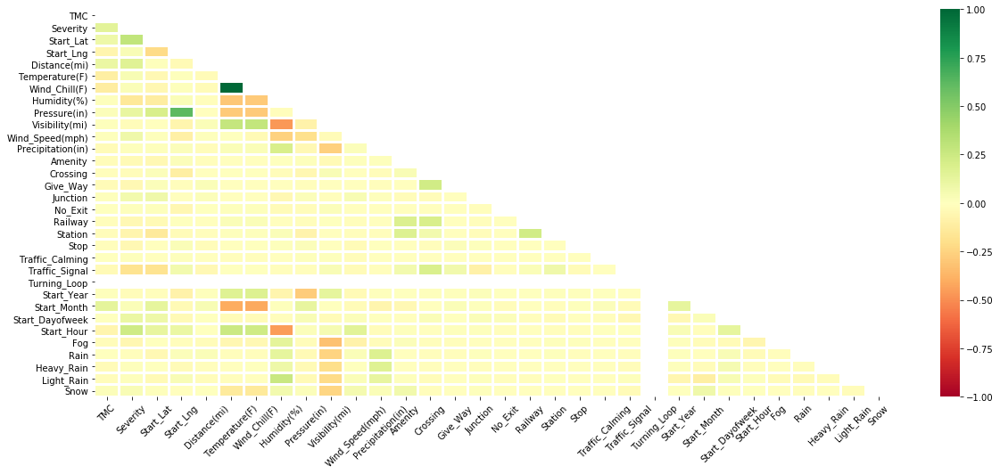

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20, 8))

# Create a mask to display only the lower triangle of the matrix
mask = np.zeros_like(dat.corr())
mask[np.triu_indices_from(mask)] = True

sns.heatmap(dat.corr(), cmap='RdYlGn', vmax=1.0, vmin=-1.0 , mask = mask, linewidths=2)
# cmap is a colormap. For more information, refer to http://matplotlib.org/examples/color/colormaps_reference.html

plt.yticks(rotation=0)
plt.xticks(rotation=45)

In [ ]:
dat1 = dat [['Severity',
             'Temperature(F)',
             'Wind_Chill(F)',
             'Humidity(%)',
             'Visibility(mi)',
             'Wind_Speed(mph)',
             'Precipitation(in)',
             'Fog',
             'Rain',
             'Heavy_Rain',
             'Light_Rain',
             'Snow']]

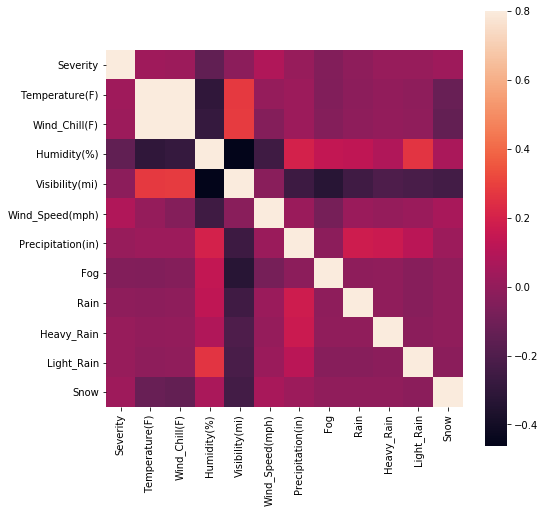

In [ ]:
corrmat = dat1.corr()
f, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(corrmat, vmax=.8, square=True)

plt.show()

Let's create a refined dataset by deselecting some unrelated variables from the original data frame.

In [ ]:
dat_refined = dat [['Severity', 'Distance(mi)', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Visibility(mi)', 'Wind_Speed(mph)',
             'Precipitation(in)', 'Fog', 'Rain', 'Heavy_Rain', 'Light_Rain', 'Snow', 'Start_Year', 'Start_Month', 'Start_Dayofweek', 'Start_Hour']]
dat_refined.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5424 entries, 20 to 7664
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Severity           5424 non-null   int64  
 1   Distance(mi)       5424 non-null   float64
 2   Temperature(F)     5424 non-null   float64
 3   Wind_Chill(F)      5424 non-null   float64
 4   Humidity(%)        5424 non-null   float64
 5   Visibility(mi)     5424 non-null   float64
 6   Wind_Speed(mph)    5424 non-null   float64
 7   Precipitation(in)  5424 non-null   float64
 8   Fog                5424 non-null   uint8  
 9   Rain               5424 non-null   uint8  
 10  Heavy_Rain         5424 non-null   uint8  
 11  Light_Rain         5424 non-null   uint8  
 12  Snow               5424 non-null   uint8  
 13  Start_Year         5424 non-null   int64  
 14  Start_Month        5424 non-null   int64  
 15  Start_Dayofweek    5424 non-null   int64  
 16  Start_Hour         5424

### 3.4 Explore the Refined Dataset


Let's show the kernel density estimation plot on the diagonal for all numerical columns in the refined dataset, excluding the year, month, hour and dayofweek.

Scatter plot matrix in a single plot.

In [ ]:
import warnings
warnings.filterwarnings('ignore')

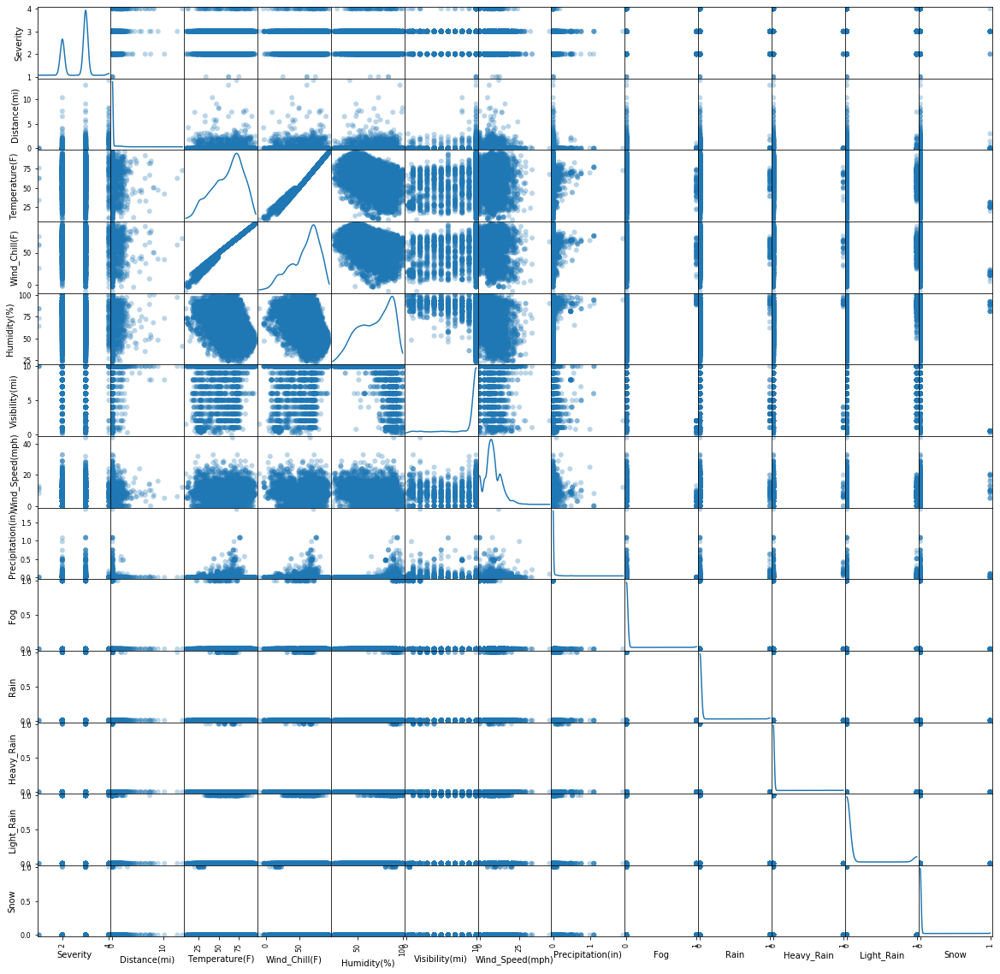

In [ ]:
column_index = ['Severity', 'Distance(mi)', 'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Visibility(mi)', 'Wind_Speed(mph)',
             'Precipitation(in)', 'Fog', 'Rain', 'Heavy_Rain', 'Light_Rain', 'Snow']
scatterplot = pd.plotting.scatter_matrix(dat_refined[column_index],
                           alpha=0.3,
                           figsize=(20, 20),
                           diagonal='kde',
                           marker='o',
                           grid=True)

#### 3.4.1. Severity Analysis

In [ ]:
dat.Severity.value_counts()

3    3419
2    1904
4      97
1       4
Name: Severity, dtype: int64

In [ ]:
dat.Severity.unique()

array([3, 1, 2, 4], dtype=int64)

Let's analyze the Impact of different features on Severity

#### 3.4.2. Severity of accidents by month

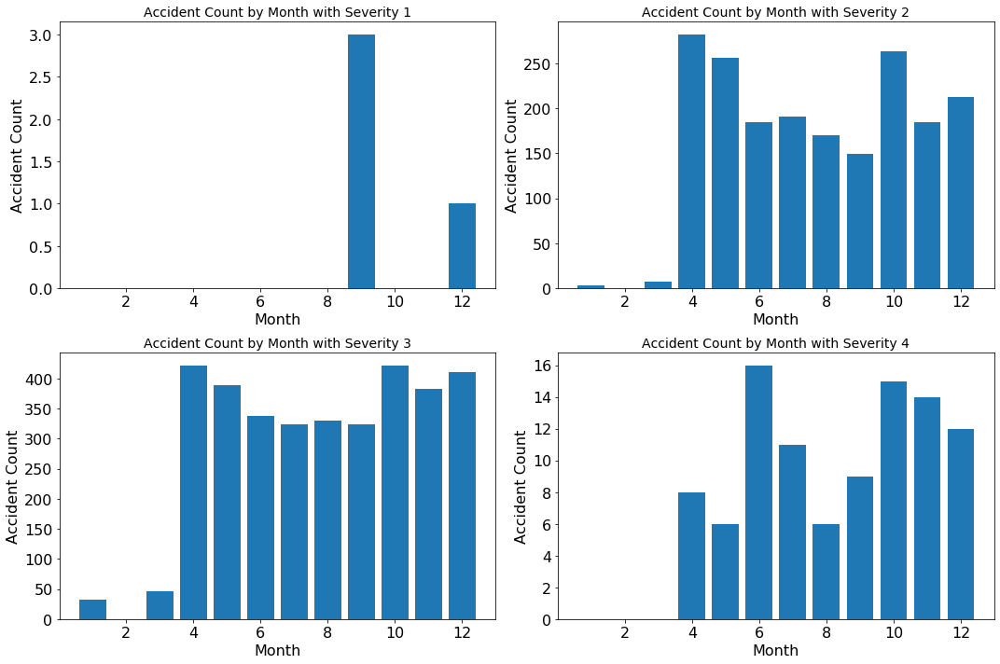

In [ ]:
plt.subplots(2,2,figsize=(15,10))
for s in np.arange(1,5):
    plt.subplot(2,2,s)
    plt.hist(dat.loc[dat["Severity"] == s]['Start_Month'], bins=[1,2,3,4,5,6,7,8,9,10,11,12,13], align='left', rwidth=0.8)
    plt.title("Accident Count by Month with Severity " + str(s), fontsize=14)
    plt.xlabel("Month", fontsize=16)
    plt.ylabel("Accident Count", fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
plt.tight_layout()
plt.show()

For Severity 1: We observe that there are more accidents in the month of September (9) when compared to other months. Its the FALL season when there happen to be rainfalls.

For Severity 2: We observe that there are more accidents in the month of April (4) after there is less number of increase and decrease till december (12).

For Severity 3: We observe that there are more accidents from the month of April (4) till december (12).

For Severity 4: We observe that there are more number of severe accidents in the months of June (6), October (10), November (11) and December (12). These are the seasons when we have rainfall and snow.

Finally depending of entire data we can say that more number of sever accidents in fall and winter months. Thus, these seasons are more dangerous, it is interesting that January and February have much lower accident counts.

#### 3.4.3. Severity of accidents by Day

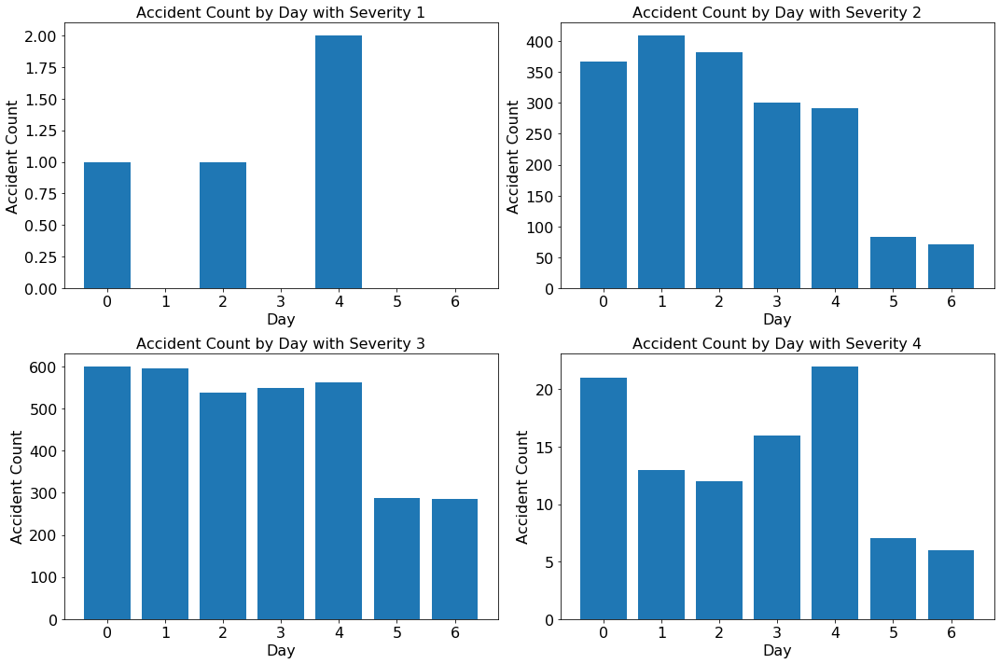

In [ ]:
plt.subplots(2,2,figsize=(15,10))
for s in np.arange(1,5):
    plt.subplot(2,2,s)
    plt.hist(dat.loc[dat["Severity"] == s]['Start_Dayofweek'], bins=[0,1,2,3,4,5,6,7], align='left', rwidth=0.8)
    plt.title("Accident Count by Day with Severity " + str(s), fontsize=16)
    plt.xlabel("Day", fontsize=16)
    plt.ylabel("Accident Count", fontsize=16)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
plt.tight_layout()
plt.show()

For all severity levels we can observe that there is a significant drop in the number of accidents during weekends.

#### 3.4.4. Severity of accidents by Weather Conditions

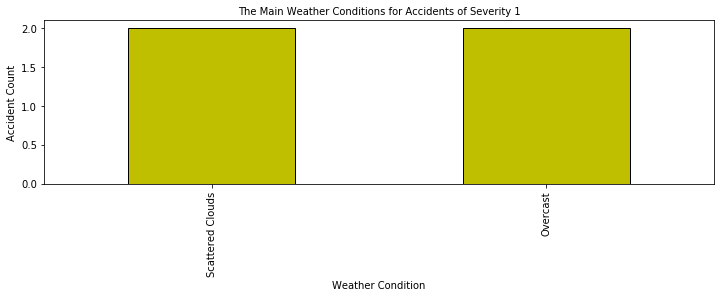

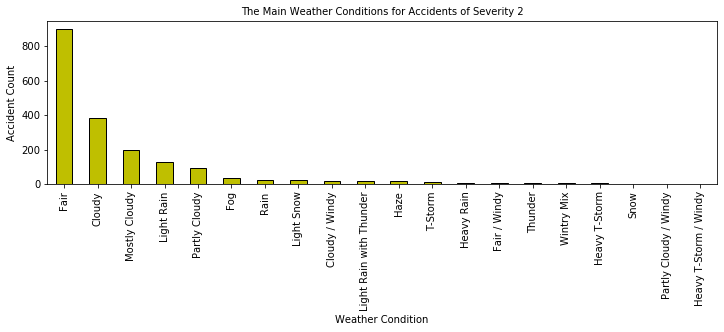

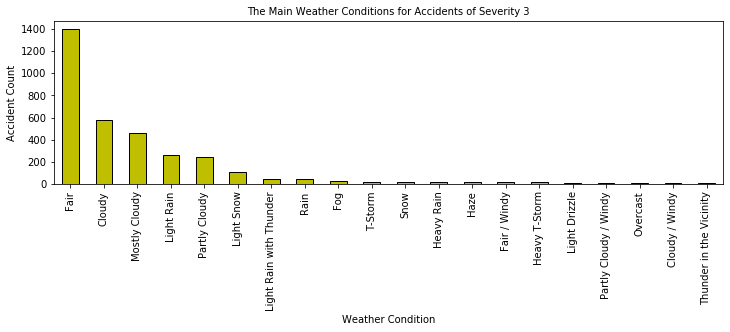

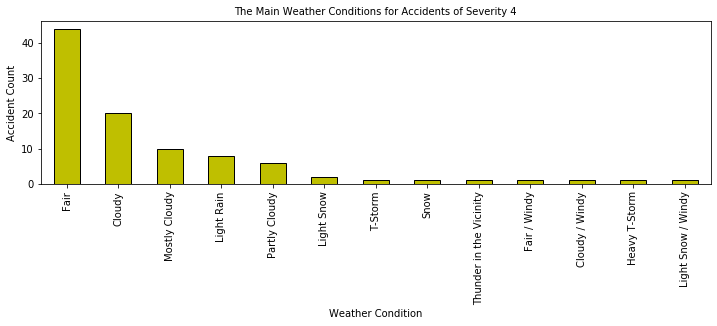

In [ ]:
for s in np.arange(1,5):
    plt.subplots(figsize=(12,3))
    dat.loc[dat["Severity"] == s]['Weather_Condition'].value_counts().sort_values(ascending=False).head(20).plot.bar(width=0.5,color='y',edgecolor='k',align='center',linewidth=1)
    plt.xlabel('Weather Condition',fontsize=10)
    plt.ylabel('Accident Count',fontsize=10)
    plt.title('The Main Weather Conditions for Accidents of Severity ' + str(s),fontsize=10)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

For severity level 1 accidents happen only under certain conditions like scattered clouds, overcast and clear.

Whereas for the remaining levels of severity (2,3,4), most accidents happen under fair, cloudy, Mostly cloudy or similar weather conditions. These conditions are considered good compared to rain and snow, Perhaps they are the most frequent conditions. Light rain and light snow are the top adverse weather conditions. Most likely these cause accidents since they can make roads slippery without causing concern in the drivers.

Lets see the severity of accidents under conditions like fog, light rain, heavy rain and snow

#### 3.4.5. Severity of accidents by Fog, Light Rain, Heavy Rain and Snow

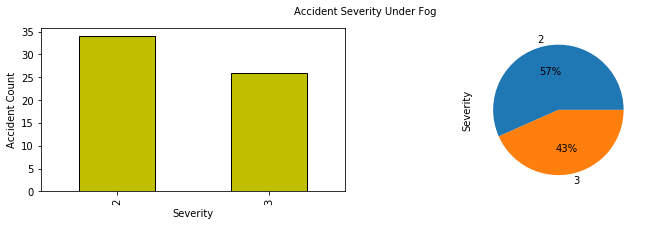

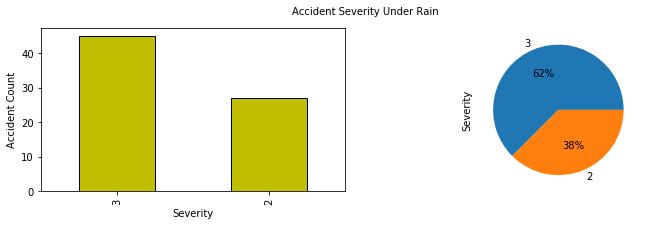

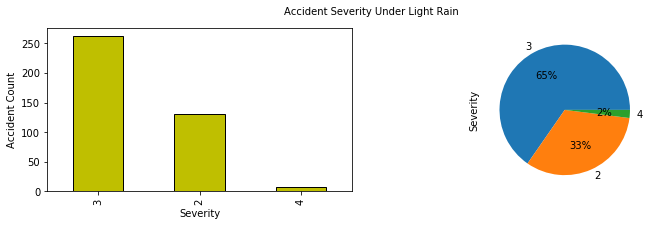

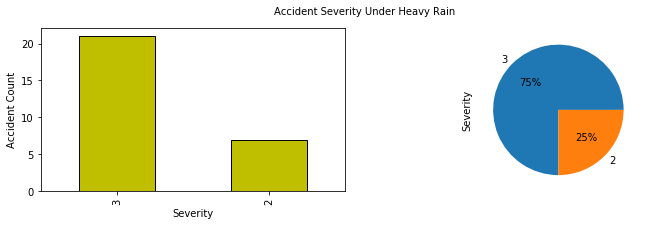

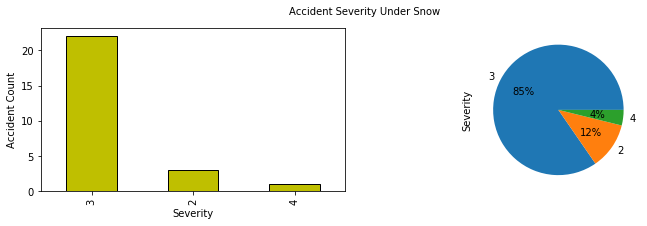

In [ ]:
for s in ["Fog","Rain","Light Rain","Heavy Rain","Snow"]:
    plt.subplots(1,2,figsize=(12,3))
    plt.suptitle('Accident Severity Under ' + s,fontsize=10)
    plt.subplot(1,2,1)
    dat.loc[dat["Weather_Condition"] == s]['Severity'].value_counts().plot.bar(width=0.5,color='y',edgecolor='k',align='center',linewidth=1)
    plt.xlabel('Severity',fontsize=10)
    plt.ylabel('Accident Count',fontsize=10)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.subplot(1,2,2)
    dat.loc[dat["Weather_Condition"] == s]['Severity'].value_counts().plot.pie(autopct='%1.0f%%',fontsize=10)

The proportion of level 3 accidents increases as weather changes from fog (49%) to rain (66%) to light rain (70%)  to heavy rain (79%) to snow (85%).

Whereas we have level 4 accidents under two weather conditions, which are light rain(2%) to snow(4%).

#### 3.4.6. Severity of accidents by Infrasturcture like Amenity, Crossing, Give_Way, Junction, No_Exit, Railway, Station, Stop, Traffic_Calming, Traffic_Signal, Turning_Loop

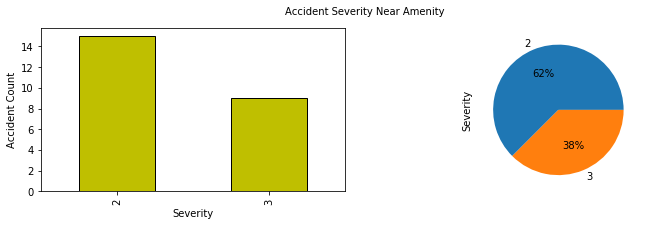

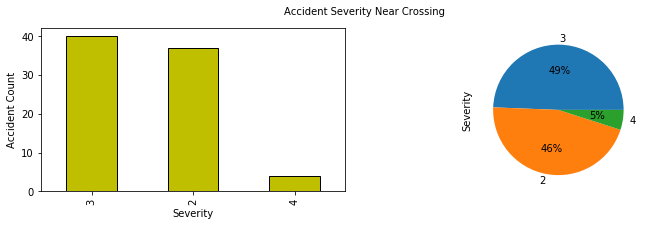

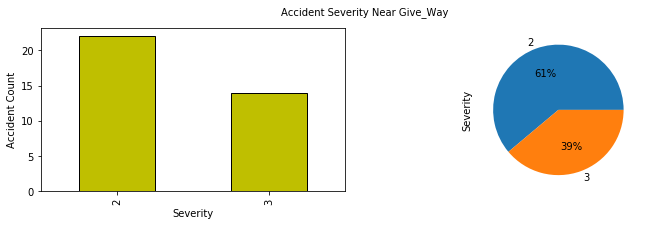

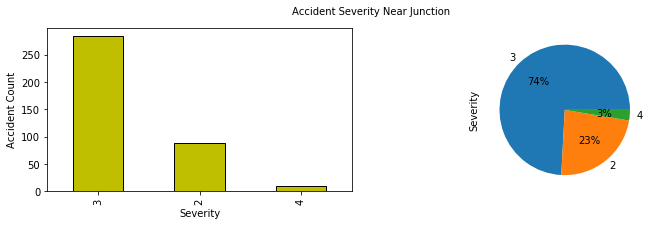

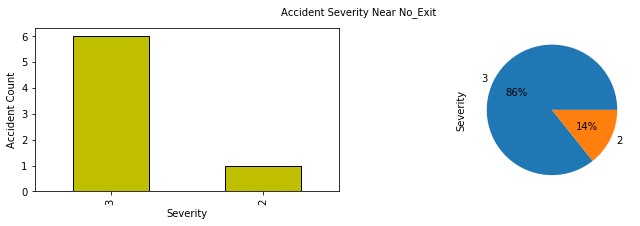

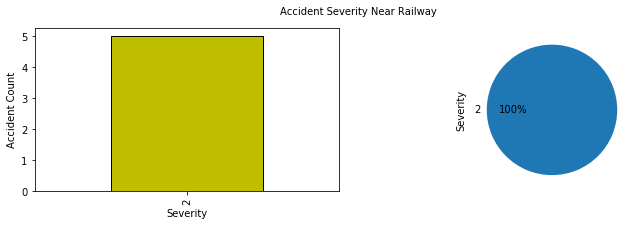

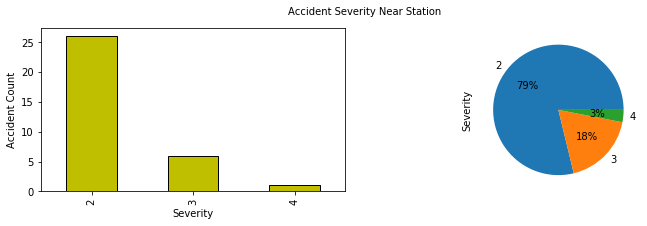

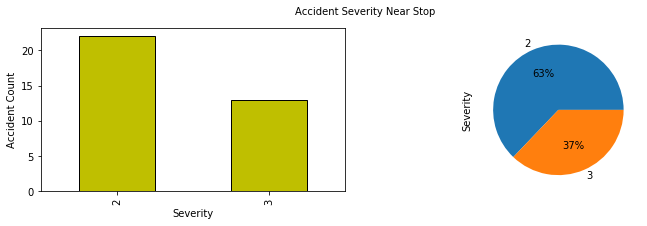

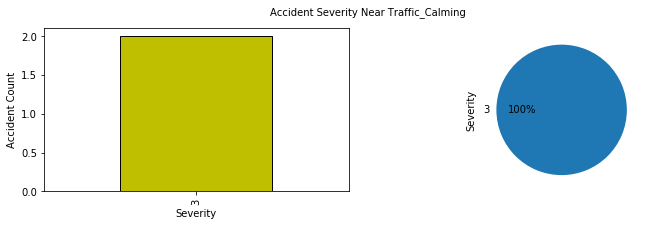

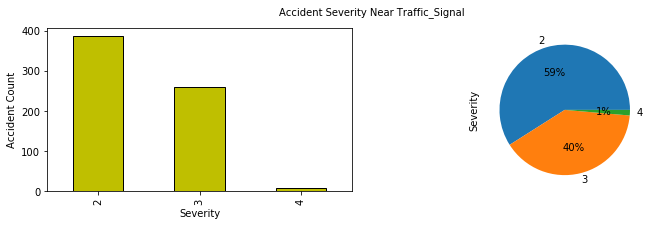

In [ ]:
for s in ['Amenity', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop']:
    # check if infrastructure type is found in any record 
    if (dat[s] == True).sum() > 0:
        plt.subplots(1,2,figsize=(12,3))
        plt.xticks(fontsize=10)
        plt.suptitle('Accident Severity Near ' + s,fontsize=10)
        plt.subplot(1,2,1)
        dat.loc[dat[s] == True]['Severity'].value_counts().plot.bar(width=0.5,color='y',edgecolor='k',align='center',linewidth=1)
        plt.xlabel('Severity',fontsize=10)
        plt.ylabel('Accident Count',fontsize=10)
        plt.xticks(fontsize=10)
        plt.yticks(fontsize=10)
        plt.subplot(1,2,2)
        dat.loc[dat[s] == True]['Severity'].value_counts().plot.pie(autopct='%1.0f%%',fontsize=10)

Junctions and no exit have the highest proportion of level 3. Whereas creossing, junction, station and traffic signal level 4 severity accidents are taking place.

### 3.5. Principal Component Analysis

In [ ]:
dat.sample(10)

,ID,Source,TMC,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,...,Start_Year,Start_Month,Start_Dayofweek,Start_Hour,Fog,Rain,Heavy_Rain,Light_Rain,Snow,day_zone
3243,A-623739,MapQuest,201,3,2019-10-31 13:36:00,2019-10-31 15:30:00,38.938232,-94.509537,0.00,Right lane closed due to accident on I-470 Wes...,...,2019,10,3,13,0,0,0,0,0,afternoon
7219,A-1011284,MapQuest,201,3,2019-04-19 18:23:00,2019-04-19 19:08:00,38.816689,-90.953629,0.00,Left lane closed due to accident on I-70 Eastb...,...,2019,4,4,18,0,0,0,0,0,afternoon
2635,A-570060,MapQuest,201,3,2019-10-06 13:29:00,2019-10-06 13:58:00,39.106884,-94.592201,0.00,Right lane closed due to accident on I-70 East...,...,2019,10,6,13,0,0,0,0,0,afternoon
5708,A-881158,MapQuest,201,3,2019-06-12 08:43:00,2019-06-12 09:13:00,39.096226,-94.563873,0.00,Left lane blocked due to accident on I-70 West...,...,2019,6,2,8,0,0,0,0,0,morning
2367,A-550978,MapQuest,201,3,2019-12-15 14:15:00,2019-12-15 15:29:00,39.004360,-94.356865,0.00,Left lane blocked and left hand shoulder block...,...,2019,12,6,14,0,0,0,0,1,afternoon
6519,A-953551,MapQuest,201,3,2019-05-23 17:52:00,2019-05-23 19:07:00,38.968323,-92.371109,0.00,Left lane blocked due to accident on I-70 West...,...,2019,5,3,17,0,0,0,0,0,afternoon
4690,A-778943,MapQuest,201,3,2019-07-01 13:12:00,2019-07-01 13:57:00,38.347977,-90.395912,0.00,2 right lane blocked due to accident on I-55 N...,...,2019,7,0,13,0,0,0,0,0,afternoon
6792,A-976910,MapQuest,201,2,2019-04-02 06:47:00,2019-04-02 07:47:00,38.248268,-90.484451,0.00,Accident on MO-Z at Mapaville Fire Dept.,...,2019,4,1,6,0,0,0,0,0,night
5782,A-889509,MapQuest,201,2,2019-06-17 09:57:00,2019-06-17 12:11:00,38.618420,-90.269989,1.31,Accident on exit ramp from I-44 Eastbound at E...,...,2019,6,0,9,0,0,0,0,0,morning
6243,A-929002,MapQuest,201,2,2019-05-10 08:23:00,2019-05-10 09:09:00,37.241482,-93.343948,0.00,Left turn lane blocked due to accident on MO-7...,...,2019,5,4,8,0,0,0,0,0,morning


In [ ]:
dat.corr()

,TMC,Severity,Start_Lat,Start_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),...,Turning_Loop,Start_Year,Start_Month,Start_Dayofweek,Start_Hour,Fog,Rain,Heavy_Rain,Light_Rain,Snow
TMC,1.000000,0.148428,0.088813,-0.068543,0.106910,-0.106979,-0.114784,0.007943,0.021223,0.014274,...,NaN,0.014883,0.136668,0.003193,-0.064817,-0.020586,0.006565,-0.024942,-0.021333,0.015852
Severity,0.148428,1.000000,0.292266,0.038825,0.162850,0.039679,0.027385,-0.143652,0.113232,-0.017907,...,NaN,-0.020641,0.026827,0.101839,0.239256,-0.048140,-0.009186,0.011957,0.015458,0.035082
Start_Lat,0.088813,0.292266,1.000000,-0.217712,0.013590,-0.043364,-0.048703,-0.113108,0.200477,-0.002154,...,NaN,-0.010869,0.131034,0.087021,0.119337,0.004468,-0.043503,0.007481,-0.038707,0.015078
Start_Lng,-0.068543,0.038825,-0.217712,1.000000,-0.035156,0.010555,0.014748,0.026117,0.619916,-0.066995,...,NaN,-0.083128,-0.032579,-0.036217,0.104572,-0.014680,0.022200,-0.027146,0.038240,-0.000180
Distance(mi),0.106910,0.162850,0.013590,-0.035156,1.000000,-0.024828,-0.027322,-0.009967,-0.000183,0.028359,...,NaN,0.013359,0.039411,0.005040,0.005719,-0.017627,0.023594,-0.014478,-0.021193,0.007394
Temperature(F),-0.106979,0.039679,-0.043364,0.010555,-0.024828,1.000000,0.994523,-0.300298,-0.283810,0.277601,...,NaN,0.167302,-0.399675,-0.026063,0.256331,-0.049105,-0.014172,-0.001371,-0.013666,-0.125890
Wind_Chill(F),-0.114784,0.027385,-0.048703,0.014748,-0.027322,0.994523,1.000000,-0.283344,-0.288846,0.283585,...,NaN,0.179672,-0.410120,-0.024234,0.242143,-0.041864,-0.010477,0.001808,-0.006347,-0.139348
Humidity(%),0.007943,-0.143652,-0.113108,0.026117,-0.009967,-0.300298,-0.283344,1.000000,-0.012268,-0.462650,...,NaN,-0.065639,0.009237,-0.014476,-0.451580,0.139755,0.131415,0.086324,0.265501,0.067315
Pressure(in),0.021223,0.113232,0.200477,0.619916,-0.000183,-0.283810,-0.288846,-0.012268,1.000000,-0.085345,...,NaN,-0.275969,0.124091,0.037924,0.017365,-0.020760,-0.033784,-0.035389,-0.036140,0.021722
Visibility(mi),0.014274,-0.017907,-0.002154,-0.066995,0.028359,0.277601,0.283585,-0.462650,-0.085345,1.000000,...,NaN,0.125536,0.003633,-0.025283,0.048980,-0.327139,-0.249112,-0.201288,-0.217669,-0.238447


#### 3.5.1. Normalize Data

In [ ]:
# Import modules and set inline mode
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale
%matplotlib inline

In [ ]:
dat.dtypes

ID                           object
Source                       object
TMC                           int64
Severity                      int64
Start_Time           datetime64[ns]
End_Time             datetime64[ns]
Start_Lat                   float64
Start_Lng                   float64
Distance(mi)                float64
Description                  object
Street                       object
Side                         object
City                         object
County                       object
Zipcode                      object
Temperature(F)              float64
Wind_Chill(F)               float64
Humidity(%)                 float64
Pressure(in)                float64
Visibility(mi)              float64
Wind_Direction               object
Wind_Speed(mph)             float64
Precipitation(in)           float64
Weather_Condition            object
Amenity                       int64
Crossing                      int64
Give_Way                      int64
Junction                    

In [ ]:
data_norm = scale(dat.loc[:,'TMC':'Severity'])

In [ ]:
type(data_norm)

numpy.ndarray

In [ ]:
pd.DataFrame(data_norm).describe().transpose()

,count,mean,std,min,25%,50%,75%,max
0,5424.0,-5.135191e-16,1.000092,-0.346247,-0.346247,-0.346247,-0.346247,7.142556
1,5424.0,2.672395e-16,1.000092,-3.266746,-1.305179,0.656387,0.656387,2.617953


In [ ]:
pd.DataFrame(data_norm).corr()

,0,1
0,1.000000,0.148428
1,0.148428,1.000000


In [ ]:
# Select the number of components
pca1 = PCA(n_components=2)

# Fit the PCA model
pca1.fit(data_norm)

PCA(copy=True, iterated_power='auto', n_components=2, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [ ]:
#The amount of variance that each PC explains
var = pca1.explained_variance_ratio_

print(var)

[0.57421395 0.42578605]


In [ ]:
#Cumulative Variance explains
var1 = np.cumsum(np.round(pca1.explained_variance_ratio_, decimals=4)*100)

print(var1)

[ 57.42 100.  ]


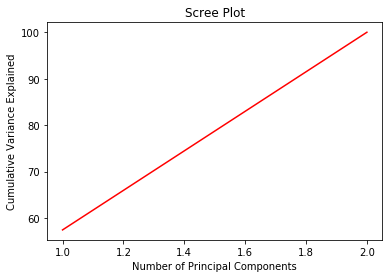

In [ ]:
var1 = pd.DataFrame(var1, index=np.arange(1,3))
plt.plot(var1,color='red')
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Variance Explained')
plt.savefig('scree_plot.png',dpi=100,bbox_inches='tight')

In [ ]:
# Show the graph
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.890383 to fit



In [ ]:
# Save the graph as a png file
graph.write_png("dt_Severity.png")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.890383 to fit



True

Now, let's use the test dataset to assess the performance of the trained model.

In [ ]:
pred_y_dt = dt.predict(test_X)

In [ ]:
# Print confusion matrix
metrics.confusion_matrix(test_y, pred_y_dt)

array([[  0,   1,   0,   0],
       [  0, 290, 267,   6],
       [  0, 273, 749,  22],
       [  0,   5,   9,   6]])

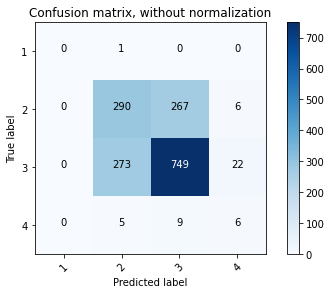

In [ ]:
# Compute confusion matrix
cnf_matrix = metrics.confusion_matrix(test_y, pred_y_dt)

# Plot non-normalized confusion matrix
plot_confusion_matrix(cnf_matrix, classes=['1','2','3','4'],
                      title='Confusion matrix, without normalization')

In [ ]:
# Calculate classification accuracy
metrics.accuracy_score(test_y, pred_y_dt)

0.6418918918918919

In [ ]:
# Calculate Cohen's Kappa
metrics.cohen_kappa_score(test_y, pred_y_dt)

0.24628253009512746

In [ ]:
# Print classification report
print(metrics.classification_report(test_y, pred_y_dt))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00         1
           2       0.51      0.52      0.51       563
           3       0.73      0.72      0.72      1044
           4       0.18      0.30      0.22        20

    accuracy                           0.64      1628
   macro avg       0.35      0.38      0.36      1628
weighted avg       0.65      0.64      0.64      1628



## 4. Summary

We started our research in the hopes of finding any correlations with traffic accidents using the dataset we acquired. The dataset contained numerous missing values and multiple columns that were not relevant to our research questions, so we removed the missing values and the irrelevant columns to clean our data. 

Once our dataset was clean, we then transformed out data and created dummy variables for things we wanted to cross tabulate to find correlations such as the different weather conditions. 

In section 3.2.1, we were able to construct a graph from the longitude and latitude of each accident in our dataset which resulted in a rough sketch of Missouri. It depicts three major areas of accidents and on closer inspection two of the areas can clearly be seen as Kansas City and St. Louis. 

In section 3.3, we found out that the severity is positively associated with the extreme weather conditions like 'Heavy_Rain', 'Light_Rain', 'Snow' and 'Distance(mi)', Temperature(F), Wind_Chill(F), Pressure(in), Wind_Speed(mph), Precipitation(in). This was particularly interesting to see as it proved that weather such as Snow increased the average severity of an accident. 

In section 3.4.3, we were able to visualize the counts of accidents in relation to the days of the week (0 = Sunday, 1 = Monday, 2 = Tuesday, 3 = Wednesday, 4 = Thursday, 5 = Friday, 6 = Saturday). From the graphs that were constructed, we can see that a majority of the accidents were of severity 2 and 3. We can also see that there are significantly less accidents on Friday and Saturday.

Some variables that can be used to predict road accidents are the day of the week, the weather, and the area that the driver is in. Since there are less average accidents on Friday and Saturday, a driver is less likely to be in accident on those days. If the weather is extreme in the terms of snow or heavy rain, then the driver will have a higher risk of being in an accident. Extreme weather conditions such as snow and heavy weather have a positive correlation to the severity of an accident so a driver driving in these conditions would not only be at higher risk of an accident, but of also being in a more severe accident. Also, if the driver is in a densely populated area such as Kansas City or St. Louis, then they will be at higher risk of being in accident as there are more drivers on the road compared to lesser populated areas. 